In [1]:
# import autosklearn.regression
import sklearn.model_selection
import sklearn.metrics
import os
import pandas as pd
from sklearn.ensemble import RandomForestRegressor
from sklearn.feature_selection import RFECV
import xgboost as xgb
from sklearn.model_selection import GridSearchCV

import warnings
warnings.filterwarnings('ignore')
warnings.simplefilter('ignore')

from datetime import datetime

<h2>02 Data Collection</h2>

In [2]:
df = []
src = r"C:\Users\Acer\Desktop\Hackathon4\farm-connect-soil-water-content-prediction\train\train"
for file in os.listdir(src):
    df.append(pd.read_csv(os.path.join(src,file)))
for i in df:
    print(list(i))
df = pd.concat(df)
df = df.fillna(0)
df[-10:]

['index', 'time', '1Air Humidity', '1AirTemperature', '1LightHigh', '1LightLow', '11Rain Accumulate (mm)', '11Rain count', '12WindSpeed', '13WindDirection', '23SoilWC ค.ชื้นดิน', '23SoilTemp.อุณหภูมิดิน', '23SoilEC', '23SoilpH', '26N', '26P', '26K', '29SoilTension', 'flow1']
['index', 'time', '1Air Humidity', '1AirTemperature', '1LightHigh', '1LightLow', '11Rain Accumulate (mm)', '11Rain count', '12WindSpeed', '13WindDirection', '23SoilTemp.อุณหภูมิดิน', '23SoilEC', '23SoilpH', '26N', '26P', '26K', '29SoilTension', 'flow1']
['index', 'time', '1Air Humidity', '1AirTemperature', '1LightHigh', '1LightLow', '11Rain Accumulate (mm)', '11Rain count', '12WindSpeed', '13WindDirection', '23SoilWC ค.ชื้นดิน', '23SoilTemp.อุณหภูมิดิน', '23SoilEC', '23SoilpH', '26N', '26P', '26K', '29SoilTension', 'flow1']
['index', 'time', '1Air Humidity', '1AirTemperature', '1LightHigh', '1LightLow', '11Rain Accumulate (mm)', '11Rain count', '12WindSpeed', '13WindDirection', '23SoilWC ค.ชื้นดิน', '23SoilTemp.อุณ

,index,time,1Air Humidity,1AirTemperature,1LightHigh,1LightLow,11Rain Accumulate (mm),11Rain count,12WindSpeed,13WindDirection,23SoilWC ค.ชื้นดิน,23SoilTemp.อุณหภูมิดิน,23SoilEC,23SoilpH,26N,26P,26K,29SoilTension,flow1
104,12_105,04:40:16.090733+00,44.1,31.2,0.0,47.64,0.0,0.0,0.5,3.0,38.8,22.8,0.11,5.0,21.0,95.0,87.0,105.0,0.0
105,12_106,04:42:16.132055+00,44.2,31.2,0.0,49.50,0.0,0.0,0.1,1.0,36.9,22.8,0.11,5.0,21.0,95.0,87.0,111.0,0.0
106,12_107,04:44:16.107327+00,45.2,30.8,0.0,50.03,0.0,0.0,1.2,7.0,37.4,22.8,0.11,5.0,21.0,95.0,87.0,113.0,0.0
107,12_108,04:46:16.11276+00,45.9,32.0,0.0,50.06,0.0,0.0,0.6,1.0,36.9,22.8,0.11,5.0,21.0,95.0,87.0,110.0,0.0
108,12_109,04:48:16.120498+00,41.4,33.1,0.0,50.36,0.0,0.0,0.7,7.0,37.6,22.8,0.11,5.0,21.0,95.0,87.0,108.0,0.0
109,12_110,04:50:16.123489+00,43.0,33.0,0.0,52.30,0.0,0.0,1.0,5.0,36.9,22.8,0.11,5.0,21.0,95.0,87.0,109.0,0.0
110,12_111,04:52:18.185763+00,42.5,32.5,0.0,53.76,0.0,0.0,0.8,4.0,37.4,22.8,0.11,5.0,21.0,95.0,87.0,0.0,0.0
111,12_112,04:54:16.141528+00,41.7,33.1,0.0,54.86,0.0,0.0,0.8,4.0,37.4,22.8,0.11,5.1,21.0,95.0,87.0,109.0,0.0
112,12_113,04:56:20.078654+00,0.0,0.0,0.0,0.00,0.0,0.0,0.0,2.0,36.9,22.8,0.11,5.0,21.0,95.0,87.0,104.0,0.0
113,12_114,04:58:16.116687+00,44.8,32.5,0.0,58.81,0.0,0.0,1.2,7.0,37.4,22.8,0.11,5.1,21.0,95.0,87.0,113.0,0.0


In [3]:
df.shape

(1340, 19)

In [4]:
df.columns

Index(['index', 'time', '1Air Humidity', '1AirTemperature', '1LightHigh',
       '1LightLow', '11Rain Accumulate (mm)', '11Rain count', '12WindSpeed',
       '13WindDirection', '23SoilWC ค.ชื้นดิน', '23SoilTemp.อุณหภูมิดิน',
       '23SoilEC', '23SoilpH', '26N', '26P', '26K', '29SoilTension', 'flow1'],
      dtype='object')

In [5]:
# Define the function to categorize time of day
def get_time_of_day(hour):
    if 0 <= hour < 5:           # 'Early Morning'
        return 0.0
    elif 5 <= hour < 12:        # 'Morning'
        return 1.0
    elif 12 <= hour < 17:       # 'Afternoon'
        return 2.0
    elif 17 <= hour < 21:       # 'Evening'
        return 3.0
    else:                       # 'Night'
        return 4.0

# Convert 'time' column to datetime objects, ignoring the timezone for simplicity
df['time_parsed'] = pd.to_datetime(df['time'].str.split('+').str[0], format='%H:%M:%S.%f')

# Extract hour from the 'time_parsed' column
df['hour'] = df['time_parsed'].dt.hour

# Apply the get_time_of_day function to create 'time_of_day' column
df['time_of_day'] = df['hour'].apply(get_time_of_day)

df['time_of_day'] = df['time_of_day'].astype('float64')
df['hour'] = df['hour'].astype('float64')
# Now df includes the new 'time_of_day' column
print(df[['time', 'time_of_day']])


                   time  time_of_day
0    01:00:50.174233+00          0.0
1    01:02:51.384714+00          0.0
2    01:04:52.127056+00          0.0
3    01:06:50.205974+00          0.0
4    01:08:50.162332+00          0.0
..                  ...          ...
109  04:50:16.123489+00          0.0
110  04:52:18.185763+00          0.0
111  04:54:16.141528+00          0.0
112  04:56:20.078654+00          0.0
113  04:58:16.116687+00          0.0

[1340 rows x 2 columns]


In [6]:
df

,index,time,1Air Humidity,1AirTemperature,1LightHigh,1LightLow,11Rain Accumulate (mm),11Rain count,12WindSpeed,13WindDirection,...,23SoilEC,23SoilpH,26N,26P,26K,29SoilTension,flow1,time_parsed,hour,time_of_day
0,01_1,01:00:50.174233+00,97.3,21.8,0.0,9.57,0.0,0.0,0.0,6.0,...,0.11,8.3,21.0,95.0,87.0,23.0,0.0,1900-01-01 01:00:50.174233,1.0,0.0
1,01_2,01:02:51.384714+00,96.6,22.0,0.0,9.81,0.0,0.0,0.0,6.0,...,0.11,8.3,21.0,95.0,87.0,22.0,0.0,1900-01-01 01:02:51.384714,1.0,0.0
2,01_3,01:04:52.127056+00,95.9,22.2,0.0,10.22,0.0,0.0,0.0,5.0,...,0.11,8.3,21.0,95.0,87.0,0.0,0.0,1900-01-01 01:04:52.127056,1.0,0.0
3,01_4,01:06:50.205974+00,95.3,22.4,0.0,10.25,0.0,0.0,0.0,6.0,...,0.11,8.3,21.0,95.0,87.0,22.0,0.0,1900-01-01 01:06:50.205974,1.0,0.0
4,01_5,01:08:50.162332+00,93.8,22.4,0.0,10.45,0.0,0.0,0.0,6.0,...,0.11,8.3,21.0,95.0,87.0,23.0,0.0,1900-01-01 01:08:50.162332,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
109,12_110,04:50:16.123489+00,43.0,33.0,0.0,52.30,0.0,0.0,1.0,5.0,...,0.11,5.0,21.0,95.0,87.0,109.0,0.0,1900-01-01 04:50:16.123489,4.0,0.0
110,12_111,04:52:18.185763+00,42.5,32.5,0.0,53.76,0.0,0.0,0.8,4.0,...,0.11,5.0,21.0,95.0,87.0,0.0,0.0,1900-01-01 04:52:18.185763,4.0,0.0
111,12_112,04:54:16.141528+00,41.7,33.1,0.0,54.86,0.0,0.0,0.8,4.0,...,0.11,5.1,21.0,95.0,87.0,109.0,0.0,1900-01-01 04:54:16.141528,4.0,0.0
112,12_113,04:56:20.078654+00,0.0,0.0,0.0,0.00,0.0,0.0,0.0,2.0,...,0.11,5.0,21.0,95.0,87.0,104.0,0.0,1900-01-01 04:56:20.078654,4.0,0.0


In [7]:
df.describe(include='all')

,index,time,1Air Humidity,1AirTemperature,1LightHigh,1LightLow,11Rain Accumulate (mm),11Rain count,12WindSpeed,13WindDirection,...,23SoilEC,23SoilpH,26N,26P,26K,29SoilTension,flow1,time_parsed,hour,time_of_day
count,1340,1340,1340.000000,1340.000000,1340.000000,1340.000000,1340.0,1340.0,1340.000000,1340.000000,...,1340.000000,1340.000000,1340.000000,1340.000000,1340.000000,1340.000000,1340.000000,1340,1340.000000,1340.000000
unique,1340,1340,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,01_1,01:00:50.174233+00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,1,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,NaN,48.565149,28.975373,21.761828,27.479515,0.0,0.0,0.751045,2.914179,...,0.118567,6.512910,20.721642,89.968657,83.330597,40.767164,0.403731,1900-01-01 04:27:40.767920640,3.958955,0.329104
min,NaN,NaN,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1900-01-01 00:26:03.264438,0.000000,0.000000
25%,NaN,NaN,41.800000,25.900000,0.000000,5.475000,0.0,0.0,0.100000,1.000000,...,0.110000,5.000000,21.000000,94.000000,87.000000,23.000000,0.000000,1900-01-01 02:30:48.188879104,2.000000,0.000000
50%,NaN,NaN,45.700000,29.600000,0.000000,11.005000,0.0,0.0,0.600000,2.000000,...,0.110000,7.000000,22.000000,97.000000,89.000000,29.000000,0.000000,1900-01-01 04:00:46.233681408,4.000000,0.000000
75%,NaN,NaN,52.725000,32.300000,65.530000,55.992500,0.0,0.0,1.100000,4.000000,...,0.120000,7.400000,23.000000,100.000000,93.000000,52.000000,1.000000,1900-01-01 05:37:00.989231360,5.000000,1.000000
max,NaN,NaN,97.300000,38.400000,65.530000,65.520000,0.0,0.0,5.000000,7.000000,...,0.210000,8.300000,33.000000,123.000000,116.000000,123.000000,1.000000,1900-01-01 13:03:34.487929,13.000000,2.000000


In [8]:
list(df)

['index',
 'time',
 '1Air Humidity',
 '1AirTemperature',
 '1LightHigh',
 '1LightLow',
 '11Rain Accumulate (mm)',
 '11Rain count',
 '12WindSpeed',
 '13WindDirection',
 '23SoilWC ค.ชื้นดิน',
 '23SoilTemp.อุณหภูมิดิน',
 '23SoilEC',
 '23SoilpH',
 '26N',
 '26P',
 '26K',
 '29SoilTension',
 'flow1',
 'time_parsed',
 'hour',
 'time_of_day']

In [9]:
df = df.drop(['index','time','11Rain Accumulate (mm)','11Rain count','time_parsed',],axis=1)

In [10]:
df.describe(include='all')

,1Air Humidity,1AirTemperature,1LightHigh,1LightLow,12WindSpeed,13WindDirection,23SoilWC ค.ชื้นดิน,23SoilTemp.อุณหภูมิดิน,23SoilEC,23SoilpH,26N,26P,26K,29SoilTension,flow1,hour,time_of_day
count,1340.000000,1340.000000,1340.000000,1340.000000,1340.000000,1340.000000,1340.000000,1340.000000,1340.000000,1340.000000,1340.000000,1340.000000,1340.000000,1340.000000,1340.000000,1340.000000,1340.000000
mean,48.565149,28.975373,21.761828,27.479515,0.751045,2.914179,34.977164,21.970224,0.118567,6.512910,20.721642,89.968657,83.330597,40.767164,0.403731,3.958955,0.329104
std,11.594615,4.606203,30.873723,24.924393,0.746727,2.202777,19.713135,1.738520,0.019267,1.240398,7.396645,30.364609,28.248795,31.291224,0.490828,2.702686,0.518417
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,41.800000,25.900000,0.000000,5.475000,0.100000,1.000000,31.400000,21.500000,0.110000,5.000000,21.000000,94.000000,87.000000,23.000000,0.000000,2.000000,0.000000
50%,45.700000,29.600000,0.000000,11.005000,0.600000,2.000000,36.900000,22.000000,0.110000,7.000000,22.000000,97.000000,89.000000,29.000000,0.000000,4.000000,0.000000
75%,52.725000,32.300000,65.530000,55.992500,1.100000,4.000000,42.500000,23.100000,0.120000,7.400000,23.000000,100.000000,93.000000,52.000000,1.000000,5.000000,1.000000
max,97.300000,38.400000,65.530000,65.520000,5.000000,7.000000,80.200000,23.700000,0.210000,8.300000,33.000000,123.000000,116.000000,123.000000,1.000000,13.000000,2.000000


In [11]:
print(set(df['time_of_day']))

{0.0, 1.0, 2.0}


<hr>

<h4>03 Exploratory Data Analysis (EDA)</h4>

In [12]:
import seaborn as sns
import matplotlib.pyplot as plt

In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1340 entries, 0 to 113
Data columns (total 17 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   1Air Humidity           1340 non-null   float64
 1   1AirTemperature         1340 non-null   float64
 2   1LightHigh              1340 non-null   float64
 3   1LightLow               1340 non-null   float64
 4   12WindSpeed             1340 non-null   float64
 5   13WindDirection         1340 non-null   float64
 6   23SoilWC ค.ชื้นดิน      1340 non-null   float64
 7   23SoilTemp.อุณหภูมิดิน  1340 non-null   float64
 8   23SoilEC                1340 non-null   float64
 9   23SoilpH                1340 non-null   float64
 10  26N                     1340 non-null   float64
 11  26P                     1340 non-null   float64
 12  26K                     1340 non-null   float64
 13  29SoilTension           1340 non-null   float64
 14  flow1                   1340 non-null   float6

In [14]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
1Air Humidity,1340.0,48.565149,11.594615,0.0,41.800,45.700,52.7250,97.30
1AirTemperature,1340.0,28.975373,4.606203,0.0,25.900,29.600,32.3000,38.40
1LightHigh,1340.0,21.761828,30.873723,0.0,0.000,0.000,65.5300,65.53
1LightLow,1340.0,27.479515,24.924393,0.0,5.475,11.005,55.9925,65.52
12WindSpeed,1340.0,0.751045,0.746727,0.0,0.100,0.600,1.1000,5.00
13WindDirection,1340.0,2.914179,2.202777,0.0,1.000,2.000,4.0000,7.00
23SoilWC ค.ชื้นดิน,1340.0,34.977164,19.713135,0.0,31.400,36.900,42.5000,80.20
23SoilTemp.อุณหภูมิดิน,1340.0,21.970224,1.738520,0.0,21.500,22.000,23.1000,23.70
23SoilEC,1340.0,0.118567,0.019267,0.0,0.110,0.110,0.1200,0.21
23SoilpH,1340.0,6.512910,1.240398,0.0,5.000,7.000,7.4000,8.30


In [15]:
# # Pair Plot
# sns.pairplot(df)
# plt.show()

In [16]:
def remove_outliers(df):
    cleaned_data = df.copy()
    for col in df.columns:
        if pd.api.types.is_numeric_dtype(df[col]):
            q1 = df[col].quantile(0.25)
            q3 = df[col].quantile(0.75)
            iqr = q3 - q1
            lower_bound = q1 - 1.5 * iqr
            upper_bound = q3 + 1.5 * iqr
            cleaned_data = cleaned_data[(cleaned_data[col] >= lower_bound) & (cleaned_data[col] <= upper_bound)]
    return cleaned_data

In [17]:
# Remove outliers from the dataset
df = remove_outliers(df)
df

,1Air Humidity,1AirTemperature,1LightHigh,1LightLow,12WindSpeed,13WindDirection,23SoilWC ค.ชื้นดิน,23SoilTemp.อุณหภูมิดิน,23SoilEC,23SoilpH,26N,26P,26K,29SoilTension,flow1,hour,time_of_day
49,48.0,32.3,0.0,62.16,0.0,2.0,58.5,23.4,0.12,7.8,25.0,104.0,97.0,22.0,0.0,2.0,0.0
50,45.7,33.0,0.0,61.97,0.0,4.0,57.9,23.3,0.12,7.8,25.0,103.0,96.0,21.0,0.0,2.0,0.0
51,44.8,34.4,0.0,62.74,0.0,2.0,53.3,23.4,0.12,7.8,25.0,103.0,96.0,21.0,0.0,2.0,0.0
52,45.5,34.4,0.0,63.44,0.0,3.0,52.1,23.4,0.12,7.8,24.0,103.0,96.0,21.0,0.0,2.0,0.0
53,47.3,34.2,0.0,63.31,0.0,2.0,52.3,23.4,0.12,7.9,24.0,103.0,96.0,21.0,0.0,2.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45,47.4,30.0,0.0,53.43,0.9,7.0,49.3,23.0,0.12,4.9,22.0,97.0,90.0,0.0,1.0,2.0,0.0
62,46.9,29.5,0.0,44.12,0.6,2.0,42.2,22.9,0.12,4.9,21.0,96.0,89.0,0.0,0.0,3.0,0.0
86,46.3,30.4,0.0,48.35,1.7,2.0,37.4,22.9,0.12,5.0,21.0,95.0,88.0,0.0,0.0,4.0,0.0
103,45.0,31.0,0.0,45.51,0.6,6.0,36.9,22.9,0.11,5.0,21.0,95.0,87.0,0.0,0.0,4.0,0.0


In [18]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
1Air Humidity,556.0,45.477338,7.901563,32.30,38.9000,45.30,50.500,69.10
1AirTemperature,556.0,28.678597,4.708653,17.70,25.1000,28.90,32.025,38.40
1LightHigh,556.0,33.236439,32.791110,0.00,0.0000,65.53,65.530,65.53
1LightLow,556.0,21.230773,23.616174,0.03,4.4875,8.50,46.370,65.52
12WindSpeed,556.0,0.769424,0.645232,0.00,0.3000,0.60,1.200,2.60
13WindDirection,556.0,3.008993,2.285463,0.00,1.0000,2.00,5.000,7.00
23SoilWC ค.ชื้นดิน,556.0,37.655755,5.749712,29.80,33.2000,36.90,39.700,58.70
23SoilTemp.อุณหภูมิดิน,556.0,21.395504,1.076111,19.90,20.4000,21.50,21.900,23.50
23SoilEC,556.0,0.112212,0.004448,0.11,0.1100,0.11,0.110,0.13
23SoilpH,556.0,7.002518,0.738804,4.80,6.8000,7.10,7.400,8.20


In [19]:
# # Pair Plot
# sns.pairplot(df)
# plt.show()

<h4>04 Feature Engineering</h4>

In [20]:
df.columns

Index(['1Air Humidity', '1AirTemperature', '1LightHigh', '1LightLow',
       '12WindSpeed', '13WindDirection', '23SoilWC ค.ชื้นดิน',
       '23SoilTemp.อุณหภูมิดิน', '23SoilEC', '23SoilpH', '26N', '26P', '26K',
       '29SoilTension', 'flow1', 'hour', 'time_of_day'],
      dtype='object')

In [21]:
df

,1Air Humidity,1AirTemperature,1LightHigh,1LightLow,12WindSpeed,13WindDirection,23SoilWC ค.ชื้นดิน,23SoilTemp.อุณหภูมิดิน,23SoilEC,23SoilpH,26N,26P,26K,29SoilTension,flow1,hour,time_of_day
49,48.0,32.3,0.0,62.16,0.0,2.0,58.5,23.4,0.12,7.8,25.0,104.0,97.0,22.0,0.0,2.0,0.0
50,45.7,33.0,0.0,61.97,0.0,4.0,57.9,23.3,0.12,7.8,25.0,103.0,96.0,21.0,0.0,2.0,0.0
51,44.8,34.4,0.0,62.74,0.0,2.0,53.3,23.4,0.12,7.8,25.0,103.0,96.0,21.0,0.0,2.0,0.0
52,45.5,34.4,0.0,63.44,0.0,3.0,52.1,23.4,0.12,7.8,24.0,103.0,96.0,21.0,0.0,2.0,0.0
53,47.3,34.2,0.0,63.31,0.0,2.0,52.3,23.4,0.12,7.9,24.0,103.0,96.0,21.0,0.0,2.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45,47.4,30.0,0.0,53.43,0.9,7.0,49.3,23.0,0.12,4.9,22.0,97.0,90.0,0.0,1.0,2.0,0.0
62,46.9,29.5,0.0,44.12,0.6,2.0,42.2,22.9,0.12,4.9,21.0,96.0,89.0,0.0,0.0,3.0,0.0
86,46.3,30.4,0.0,48.35,1.7,2.0,37.4,22.9,0.12,5.0,21.0,95.0,88.0,0.0,0.0,4.0,0.0
103,45.0,31.0,0.0,45.51,0.6,6.0,36.9,22.9,0.11,5.0,21.0,95.0,87.0,0.0,0.0,4.0,0.0


<h5>Feature Importance</h5>

In [22]:
dfx = df
list(dfx)

['1Air Humidity',
 '1AirTemperature',
 '1LightHigh',
 '1LightLow',
 '12WindSpeed',
 '13WindDirection',
 '23SoilWC ค.ชื้นดิน',
 '23SoilTemp.อุณหภูมิดิน',
 '23SoilEC',
 '23SoilpH',
 '26N',
 '26P',
 '26K',
 '29SoilTension',
 'flow1',
 'hour',
 'time_of_day']

In [23]:
# dfx = dfx.drop(['index','time','11Rain Accumulate (mm)','11Rain count'],axis=1)
dfx = df

<h5>relationship</h5>

In [24]:
dfx.corr().style.format("{:.4}").background_gradient(cmap=plt.get_cmap('coolwarm'), axis=1)

,1Air Humidity,1AirTemperature,1LightHigh,1LightLow,12WindSpeed,13WindDirection,23SoilWC ค.ชื้นดิน,23SoilTemp.อุณหภูมิดิน,23SoilEC,23SoilpH,26N,26P,26K,29SoilTension,flow1,hour,time_of_day
1Air Humidity,1.0,-0.6905,-0.4881,0.009322,0.1483,-0.1137,-0.3174,0.04584,-0.006159,-0.06994,-0.09476,-0.119,-0.1032,0.1051,0.5593,-0.2991,-0.09044
1AirTemperature,-0.6905,1.0,0.4099,-0.02208,-0.3701,0.1326,0.39,0.5368,0.07944,0.1157,0.3221,0.3371,0.3273,-0.1353,-0.4684,0.378,0.06415
1LightHigh,-0.4881,0.4099,1.0,-0.7099,0.05202,0.0007311,0.1314,0.07518,-0.2055,0.3786,-0.03526,-0.04843,-0.04214,-0.2946,-0.5109,0.2811,-0.02105
1LightLow,0.009322,-0.02208,-0.7099,1.0,-0.01126,-0.07412,0.1876,0.03009,0.3505,-0.4552,0.3834,0.4081,0.3963,0.3719,0.07409,-0.1335,-0.01558
12WindSpeed,0.1483,-0.3701,0.05202,-0.01126,1.0,-0.03745,-0.08021,-0.159,0.04747,-0.1172,-0.005389,0.001055,0.002337,0.1249,0.07131,0.001699,0.03655
13WindDirection,-0.1137,0.1326,0.0007311,-0.07412,-0.03745,1.0,0.1117,0.03108,-0.01082,0.06572,-0.1109,-0.1015,-0.08293,-0.1184,0.02314,-0.1568,-0.1535
23SoilWC ค.ชื้นดิน,-0.3174,0.39,0.1314,0.1876,-0.08021,0.1117,1.0,0.257,0.5281,0.1369,0.3414,0.4142,0.4016,-0.2049,-0.2515,-0.0314,-0.02952
23SoilTemp.อุณหภูมิดิน,0.04584,0.5368,0.07518,0.03009,-0.159,0.03108,0.257,1.0,0.2709,0.1404,0.6282,0.6215,0.6266,0.02241,-0.008177,0.241,0.1119
23SoilEC,-0.006159,0.07944,-0.2055,0.3505,0.04747,-0.01082,0.5281,0.2709,1.0,-0.4585,0.5823,0.6381,0.6446,0.4709,0.2013,0.01455,0.0641
23SoilpH,-0.06994,0.1157,0.3786,-0.4552,-0.1172,0.06572,0.1369,0.1404,-0.4585,1.0,-0.2276,-0.2384,-0.2368,-0.6438,-0.2336,0.01138,-0.01824


In [25]:
x = {'1Air Humidity':-0.1601,
'1AirTemperature':0.3111,
'1LightHigh':0.06379,
'1LightLow':0.1204,
'12WindSpeed':-0.1083,
'13WindDirection':0.08821,
'23SoilWC ค.ชื้นดิน':1,
'23SoilTemp.อุณหภูมิดิน':0.2677,
'23SoilEC':0.4955,
'23SoilpH':0.1313,
'26N':0.3578,
'26P':0.4464,
'26K':0.426,
'29SoilTension':-0.1967,
'flow1':-0.2115,
}
# Sort the dictionary by its values
sorted_x = dict(sorted(x.items(), key=lambda item: item[-1],reverse=True))

sorted_x

{'23SoilWC ค.ชื้นดิน': 1,
 '23SoilEC': 0.4955,
 '26P': 0.4464,
 '26K': 0.426,
 '26N': 0.3578,
 '1AirTemperature': 0.3111,
 '23SoilTemp.อุณหภูมิดิน': 0.2677,
 '23SoilpH': 0.1313,
 '1LightLow': 0.1204,
 '13WindDirection': 0.08821,
 '1LightHigh': 0.06379,
 '12WindSpeed': -0.1083,
 '1Air Humidity': -0.1601,
 '29SoilTension': -0.1967,
 'flow1': -0.2115}

In [26]:
list(df)

['1Air Humidity',
 '1AirTemperature',
 '1LightHigh',
 '1LightLow',
 '12WindSpeed',
 '13WindDirection',
 '23SoilWC ค.ชื้นดิน',
 '23SoilTemp.อุณหภูมิดิน',
 '23SoilEC',
 '23SoilpH',
 '26N',
 '26P',
 '26K',
 '29SoilTension',
 'flow1',
 'hour',
 'time_of_day']

In [27]:
# X = dfx[['1Air Humidity', '1AirTemperature', '1LightHigh',
#                 '1LightLow','12WindSpeed',
#                 '23SoilEC', '23SoilpH', '23SoilTemp.อุณหภูมิดิน',  '26N', '26P', '26K',
#                 '29SoilTension', 'flow1']]

# X = dfx[['26P', '26K', '26N', '1AirTemperature', '23SoilTemp.อุณหภูมิดิน','23SoilpH', '1LightLow', 'time_of_day']]   'XGBoost': 0.8941797429865055,   
# X = dfx[['23SoilEC', '26P', '26K', '1AirTemperature', '23SoilpH', '1LightLow']]       #  'XGBoost': 1.1382227172851562,    
# X = dfx[['23SoilEC', '26P', '26K', '1AirTemperature', '23SoilpH', '1LightLow','time_of_day']]       # 'Gradient Boosting Regression2 (lgb_best)': 0.9417558774252336
# X = dfx[['23SoilEC','26P','26K','26N','1AirTemperature','23SoilTemp.อุณหภูมิดิน','23SoilpH','1LightLow']]  #'XGBoost': 1.1545134582519532,
# X = dfx[['23SoilEC','26P','26K','26N','1AirTemperature','23SoilTemp.อุณหภูมิดิน','23SoilpH','1LightLow','time_of_day']]  # 'XGBoost (xgb_best)': 0.8907829544760962,
X = dfx[['23SoilEC','26P','26K','26N','1AirTemperature','23SoilTemp.อุณหภูมิดิน','23SoilpH','1LightLow','hour']]  

y = df[['23SoilWC ค.ชื้นดิน']]

In [28]:
X

,23SoilEC,26P,26K,26N,1AirTemperature,23SoilTemp.อุณหภูมิดิน,23SoilpH,1LightLow,hour
49,0.12,104.0,97.0,25.0,32.3,23.4,7.8,62.16,2.0
50,0.12,103.0,96.0,25.0,33.0,23.3,7.8,61.97,2.0
51,0.12,103.0,96.0,25.0,34.4,23.4,7.8,62.74,2.0
52,0.12,103.0,96.0,24.0,34.4,23.4,7.8,63.44,2.0
53,0.12,103.0,96.0,24.0,34.2,23.4,7.9,63.31,2.0
...,...,...,...,...,...,...,...,...,...
45,0.12,97.0,90.0,22.0,30.0,23.0,4.9,53.43,2.0
62,0.12,96.0,89.0,21.0,29.5,22.9,4.9,44.12,3.0
86,0.12,95.0,88.0,21.0,30.4,22.9,5.0,48.35,4.0
103,0.11,95.0,87.0,21.0,31.0,22.9,5.0,45.51,4.0


In [29]:
y

,23SoilWC ค.ชื้นดิน
49,58.5
50,57.9
51,53.3
52,52.1
53,52.3
...,...
45,49.3
62,42.2
86,37.4
103,36.9


<hr>

In [30]:
from sklearn.model_selection import train_test_split

In [31]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.078, random_state = 99)
X_train.shape, X_test.shape

((512, 9), (44, 9))

<h4>Scaling?</h4>

In [32]:
from sklearn.preprocessing import RobustScaler

In [33]:
cols = X_train.columns

In [34]:
X_train

,23SoilEC,26P,26K,26N,1AirTemperature,23SoilTemp.อุณหภูมิดิน,23SoilpH,1LightLow,hour
115,0.11,93.0,86.0,20.0,33.6,19.9,7.0,5.96,4.0
95,0.11,96.0,89.0,21.0,30.6,21.5,7.4,7.25,6.0
57,0.12,100.0,93.0,23.0,29.4,21.6,7.1,2.93,2.0
22,0.12,98.0,91.0,22.0,27.6,22.0,7.2,3.88,4.0
96,0.11,94.0,87.0,21.0,23.9,20.3,7.1,6.11,4.0
...,...,...,...,...,...,...,...,...,...
98,0.11,96.0,89.0,21.0,32.7,21.5,7.4,3.89,6.0
7,0.11,94.0,87.0,21.0,24.6,22.0,7.6,9.87,1.0
64,0.12,98.0,91.0,22.0,29.3,21.4,7.1,7.81,5.0
86,0.11,96.0,89.0,21.0,29.8,21.4,7.3,65.31,6.0


In [35]:
# scaler = RobustScaler()
# X_train = scaler.fit_transform(X_train)
# X_test = scaler.transform(X_test)

In [36]:
# X_train = pd.DataFrame(X_train, columns=[cols])
# X_test = pd.DataFrame(X_test, columns=[cols])

In [37]:
# 10/0

<hr>

<h4>05 Model Selection</h4>

In [38]:
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import GradientBoostingRegressor, RandomForestRegressor

from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import Pipeline

from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import BayesianRidge
import xgboost as xgb
import lightgbm as lgb
from sklearn.metrics import mean_absolute_error


from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, DotProduct
from sklearn.neighbors import KNeighborsRegressor
from sklearn.neural_network import MLPRegressor
from pygam import LinearGAM, s, f
import statsmodels.api as sm
from sklearn.preprocessing import StandardScaler


In [39]:
# 07 Decision Tree Regression
dt_param_grid = {
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 10, 20]
}
dt_grid_search = GridSearchCV(DecisionTreeRegressor(), dt_param_grid, cv=5, scoring='neg_mean_absolute_error')
dt_grid_search.fit(X_train, y_train)
dt_best = dt_grid_search.best_estimator_
dt_predictions = dt_best.predict(X_test)
dt_mae = mean_absolute_error(y_test, dt_predictions)
print(f'Decision Tree MSE: {dt_mae}, Best Params: {dt_grid_search.best_params_}')

#####################################################################################################################################
# from sklearn.tree import DecisionTreeRegressor
# from sklearn.model_selection import GridSearchCV
# from sklearn.metrics import mean_absolute_error

# # Expanded hyperparameter grid
# dt_param_grid = {
#     'max_depth': [None, 10, 20, 30, 40],
#     'min_samples_split': [2, 10, 20, 30],
#     'min_samples_leaf': [1, 2, 4, 6],  # Minimum number of samples required at each leaf node
#     'max_features': ['auto', 'sqrt', 'log2', None],  # Number of features to consider when looking for the best split
#     'ccp_alpha': [0.0, 0.01, 0.1]  # Complexity parameter used for Minimal Cost-Complexity Pruning
# }

# # Grid Search with Cross-Validation
# dt_grid_search = GridSearchCV(DecisionTreeRegressor(random_state=42), dt_param_grid, cv=5, scoring='neg_mean_absolute_error')
# dt_grid_search.fit(X_train, y_train)

# # Best model and predictions
# dt_best = dt_grid_search.best_estimator_
# dt_predictions = dt_best.predict(X_test)

# # Evaluate performance
# dt_mae = mean_absolute_error(y_test, dt_predictions)
# print(f'Decision Tree MAE: {dt_mae}, Best Params: {dt_grid_search.best_params_}')

Decision Tree MSE: 1.1028084415584418, Best Params: {'max_depth': 10, 'min_samples_split': 2}


In [40]:
# 08 Random Forest Regressor
from sklearn.ensemble import RandomForestRegressor

rfr = RandomForestRegressor()
rfr_param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 5, 10]
}
rfr_grid_search = GridSearchCV(rfr, rfr_param_grid, cv=5, scoring='neg_mean_absolute_error')
rfr_grid_search.fit(X_train, y_train)
rfr_best = rfr_grid_search.best_estimator_
rfr_predictions = rfr_best.predict(X_test)
rfr_mae = mean_absolute_error(y_test, rfr_predictions)
print("Random Forest Regressor mae:", rfr_mae)

#####################################################################################################################################
# # Enhanced hyperparameter grid
# rfr_param_grid = {
#     'n_estimators': [100, 200, 300],  # More options for the number of trees
#     'max_depth': [None, 5, 10, 20],  # Additional depth options for tree growth
#     'min_samples_split': [2, 5, 10],  # Minimum number of samples required to split an internal node
#     'min_samples_leaf': [1, 2, 4],  # Minimum number of samples required to be at a leaf node
#     'max_features': ['auto', 'sqrt', 'log2'],  # Number of features to consider when looking for the best split
# }

# # Grid Search with Cross-Validation
# rfr_grid_search = GridSearchCV(RandomForestRegressor(random_state=42), rfr_param_grid, cv=5, scoring='neg_mean_absolute_error')
# rfr_grid_search.fit(X_train, y_train)

# # Best model and predictions
# rfr_best = rfr_grid_search.best_estimator_
# rfr_predictions = rfr_best.predict(X_test)

# # Evaluate performance
# rfr_mae = mean_absolute_error(y_test, rfr_predictions)
# print(f'Random Forest Regressor MAE: {rfr_mae}, Best Params: {rfr_grid_search.best_params_}')


Random Forest Regressor mae: 0.8711250000000131


In [41]:
# 09 Gradient Boosting Regression (XGBoost)
import xgboost as xgb

xgb_param_grid = {
    'n_estimators': [100, 200],
    'learning_rate': [0.01, 0.1],
    'max_depth': [3, 6, 9]
}
xgb_grid_search = GridSearchCV(xgb.XGBRegressor(), xgb_param_grid, cv=5, scoring='neg_mean_absolute_error')
xgb_grid_search.fit(X_train, y_train)
xgb_best = xgb_grid_search.best_estimator_
xgb_predictions = xgb_best.predict(X_test)
xgb_mae = mean_absolute_error(y_test, xgb_predictions)
print(f'XGBoost MSE: {xgb_mae}, Best Params: {xgb_grid_search.best_params_}')
#####################################################################################################################################
# # Extended hyperparameter grid
# xgb_param_grid = {
#     'n_estimators': [100, 200, 300],
#     'learning_rate': [0.01, 0.05, 0.1, 0.2],
#     'max_depth': [3, 6, 9, 12],
#     'subsample': [0.6, 0.8, 1.0],  # Fraction of observations to be randomly sampled for each tree.
#     'colsample_bytree': [0.6, 0.8, 1.0],  # Fraction of features to be randomly sampled for each tree.
#     'gamma': [0, 0.1, 0.2]  # Minimum loss reduction required to make a further partition on a leaf node.
# }

# # Grid Search with Cross-Validation
# xgb_grid_search = GridSearchCV(xgb.XGBRegressor(objective='reg:squarederror', random_state=42), xgb_param_grid, cv=5, scoring='neg_mean_absolute_error')
# xgb_grid_search.fit(X_train, y_train)

# # Best model and predictions
# xgb_best = xgb_grid_search.best_estimator_
# xgb_predictions = xgb_best.predict(X_test)

# # Evaluate performance
# xgb_mae = mean_absolute_error(y_test, xgb_predictions)
# print(f'XGBoost MAE: {xgb_mae}, Best Params: {xgb_grid_search.best_params_}')


XGBoost MSE: 0.9644247661937364, Best Params: {'learning_rate': 0.1, 'max_depth': 6, 'n_estimators': 100}


In [42]:
# Gradient Boosting Regression Trees
gbrt = GradientBoostingRegressor()
gbrt_param_grid = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.05, 0.1, 0.2]
    }
gbrt_grid_search = GridSearchCV(gbrt, gbrt_param_grid, cv=5, scoring='neg_mean_absolute_error')
gbrt_grid_search.fit(X_train, y_train)
gbrt_best = gbrt_grid_search.best_estimator_
gbrt_predictions = gbrt_best.predict(X_test)
gbrt_mae = mean_absolute_error(y_test, gbrt_predictions)
print(f"{gbrt_mae} Gradient Boosting Regression")


1.1102069435255295 Gradient Boosting Regression


In [43]:
# 10 Gradient Boosting Regression (LightGBM)
import lightgbm as lgb

lgb_param_grid = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.05, 0.1],
    'max_depth':[3, 6, 9, -1],
    'num_leaves': [31, 62, 127, 255]
}
lgb_grid_search = GridSearchCV(lgb.LGBMRegressor(), lgb_param_grid, cv=5, scoring='neg_mean_absolute_error')
lgb_grid_search.fit(X_train, y_train)
lgb_best = lgb_grid_search.best_estimator_
lgb_predictions = lgb_best.predict(X_test)
lgb_mae = mean_absolute_error(y_test, lgb_predictions)

print(f"{lgb_mae} Gradient Boosting Regression")
# #####################################################################################################################################



[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000038 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 336
[LightGBM] [Info] Number of data points in the train set: 409, number of used features: 9
[LightGBM] [Info] Start training from score 37.397066
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000070 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 335
[LightGBM] [Info] Number of data points in the train set: 410, number of used features: 9
[LightGBM] [Info] Start training from score 37.649512
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

In [44]:
# K-Nearest Neighbors Regression (KNN)

from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_absolute_error
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

knn_param_grid = {
    'n_neighbors': [3, 5, 7],
    'weights': ['uniform', 'distance'],
    'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute']
}
knn_grid_search = GridSearchCV(KNeighborsRegressor(), knn_param_grid, cv=5, scoring='neg_mean_absolute_error')
knn_grid_search.fit(X_train, y_train)
knn_best = knn_grid_search.best_estimator_
knn_predictions = knn_best.predict(X_test)
knn_mae = mean_absolute_error(y_test, knn_predictions)
print(f'KNN Regression MAE: {knn_mae}, Best Params: {knn_grid_search.best_params_}')

#####################################################################################################################################
# # Scale the features
# scaler = StandardScaler()
# X_train_scaled = scaler.fit_transform(X_train)
# X_test_scaled = scaler.transform(X_test)

# # Optionally apply PCA for dimensionality reduction
# # pca = PCA(n_components='mle')  # mle lets PCA decide the number of components to keep
# # X_train_scaled = pca.fit_transform(X_train_scaled)
# # X_test_scaled = pca.transform(X_test_scaled)

# # Expanded hyperparameter grid
# knn_param_grid = {
#     'n_neighbors': range(1, 10),  # Consider testing a broader range of neighbors
#     'weights': ['uniform', 'distance'],
#     'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
#     # 'metric': ['euclidean', 'manhattan', 'minkowski'],  # Optional: Explore different distance metrics
# }

# # Grid Search with Cross-Validation
# knn_grid_search = GridSearchCV(KNeighborsRegressor(), knn_param_grid, cv=5, scoring='neg_mean_absolute_error')
# knn_grid_search.fit(X_train_scaled, y_train)

# # Best model and predictions
# knn_best = knn_grid_search.best_estimator_
# knn_predictions = knn_best.predict(X_test_scaled)

# # Evaluate performance
# knn_mae = mean_absolute_error(y_test, knn_predictions)
# print(f'KNN Regression MAE: {knn_mae}, Best Params: {knn_grid_search.best_params_}')


KNN Regression MAE: 1.627350516608451, Best Params: {'algorithm': 'brute', 'n_neighbors': 3, 'weights': 'distance'}


In [45]:
# # # 12 Neural Network Regression
# from sklearn.neural_network import MLPRegressor
# from sklearn.preprocessing import StandardScaler

# nn_param_grid = {
#     'hidden_layer_sizes': [(50,), (100,), (50,50)],
#     'activation': ['relu', 'tanh', 'logistic'],
#     'solver': ['adam', 'lbfgs']
# }
# scaler = StandardScaler().fit(X_train)
# X_train_scaled = scaler.transform(X_train)
# X_test_scaled = scaler.transform(X_test)
# nn_grid_search = GridSearchCV(MLPRegressor(max_iter=1000), nn_param_grid, cv=5, scoring='neg_mean_absolute_error')
# nn_grid_search.fit(X_train_scaled, y_train)
# nn_best = nn_grid_search.best_estimator_
# nn_predictions = nn_best.predict(X_test_scaled)
# nn_mae = mean_absolute_error(y_test, nn_predictions)
# print(f'Neural Network Regression MAE: {nn_mae}, Best Params: {nn_grid_search.best_params_}')

# #####################################################################################################################################
# # # Expanded hyperparameter grid
# # nn_param_grid = {
# #     'hidden_layer_sizes': [(50,), (100,), (50,50), (100, 100), (50, 100, 50)],
# #     'activation': ['relu', 'tanh', 'logistic'],
# #     'solver': ['adam', 'lbfgs'],
# #     'alpha': [0.0001, 0.001, 0.01],  # L2 penalty (regularization term) parameter.
# #     'learning_rate_init': [0.001, 0.01, 0.1],  # The initial learning rate used.
# # }

# # # Scale features
# # scaler = StandardScaler().fit(X_train)
# # X_train_scaled = scaler.transform(X_train)
# # X_test_scaled = scaler.transform(X_test)

# # # Early stopping setup
# # early_stopping = {'n_iter_no_change': 10, 'validation_fraction': 0.1, 'tol': 0.001}

# # # Grid Search with Cross-Validation
# # nn_grid_search = GridSearchCV(MLPRegressor(max_iter=1000, **early_stopping), nn_param_grid, cv=5, scoring='neg_mean_absolute_error')
# # nn_grid_search.fit(X_train_scaled, y_train)

# # # Best model and predictions
# # nn_best = nn_grid_search.best_estimator_
# # nn_predictions = nn_best.predict(X_test_scaled)

# # # Evaluate performance
# # nn_mae = mean_absolute_error(y_test, nn_predictions)
# # print(f'Neural Network Regression MAE: {nn_mae}, Best Params: {nn_grid_search.best_params_}')


In [46]:
# Random Forest baseline model
rf = RandomForestRegressor()
rf.fit(X_train,y_train)
rf_baseline = rf.predict(X_test)
rfbl_mae = mean_absolute_error(y_test, rf_baseline)
print(f'RFR MAE: {rfbl_mae}')

RFR MAE: 0.8644545454545404


In [47]:
# # XGB baseline model
# xb = xgb.XGBRegressor()
# xb.fit(X_train, y_train)
# y_hat = xb.predict(X_test)
# xbbl_mae = mean_absolute_error(y_test, y_hat)
# print(f'XGB MAE: {xbbl_mae}')

# #####################################################################################################################################

param_grid = {
        "colsample_bytree": [0.3, 0.4, 0.5],
        "gamma": [0],
        "learning_rate": [0.4, 0.5, 0.6],
        "max_depth": [1, 2, 3],
        "reg_lambda": [11, 12, 13],
        "scale_pos_weight": [0],
        "subsample": [0.4, 0.5, 0.6],
}
grid_cv = xgb.XGBRegressor()
grid_cv = GridSearchCV(
    grid_cv,
    param_grid,
    n_jobs=-1,
    cv=3,
    scoring='neg_mean_absolute_error'
)
grid_cv.fit(X_train, y_train)
grid_cv.best_params_
y_hat = grid_cv.predict(X_test)
xbbl_mae = mean_absolute_error(y_test, y_hat)
print(f'XGB MAE: {xbbl_mae}')

XGB MAE: 0.9900862346995958


In [48]:
print(f'{dt_mae} Decision Tree MSE: , Best Params: {dt_grid_search.best_params_}')
print(f"{rfr_mae} Random Forest Regressor mae:", )
print(f'{xgb_mae} XGBoost MSE: , Best Params: {xgb_grid_search.best_params_}')
print(f"{gbrt_mae} Gradient Boosting Regression2")
print(f"{lgb_mae} Gradient Boosting Regression2")
print(f'{knn_mae} Best KNN Model MAE:  Best Parameters: {knn_grid_search.best_params_}')
print(f'{xbbl_mae} XGBoost baseline')
print(f"{rfbl_mae} Random Forest Regressor mae baseline")

1.1028084415584418 Decision Tree MSE: , Best Params: {'max_depth': 10, 'min_samples_split': 2}
0.8711250000000131 Random Forest Regressor mae:
0.9644247661937364 XGBoost MSE: , Best Params: {'learning_rate': 0.1, 'max_depth': 6, 'n_estimators': 100}
1.1102069435255295 Gradient Boosting Regression2
0.8217750462012927 Gradient Boosting Regression2
1.627350516608451 Best KNN Model MAE:  Best Parameters: {'algorithm': 'brute', 'n_neighbors': 3, 'weights': 'distance'}
0.9900862346995958 XGBoost baseline
0.8644545454545404 Random Forest Regressor mae baseline


In [49]:
feature_bank = {
"Decision Tree (dt_best)":dt_mae,
"Random Forest Regressor (rfr_best)":rfr_mae,
"XGBoost (xgb_best)":xgb_mae,
"Gradient Boosting Regression (gbrt_best)":gbrt_mae,
"Gradient Boosting Regression2 (lgb_best)":lgb_mae,
"Best KNN Model (knn_best)":knn_mae,
# "Neural Network Regression":nn_mae,
"XGBoost baseline":xbbl_mae,
"Random Forest Regressor mae baseline":rfbl_mae
}

In [50]:
feature_bank

{'Decision Tree (dt_best)': 1.1028084415584418,
 'Random Forest Regressor (rfr_best)': 0.8711250000000131,
 'XGBoost (xgb_best)': 0.9644247661937364,
 'Gradient Boosting Regression (gbrt_best)': 1.1102069435255295,
 'Gradient Boosting Regression2 (lgb_best)': 0.8217750462012927,
 'Best KNN Model (knn_best)': 1.627350516608451,
 'XGBoost baseline': 0.9900862346995958,
 'Random Forest Regressor mae baseline': 0.8644545454545404}

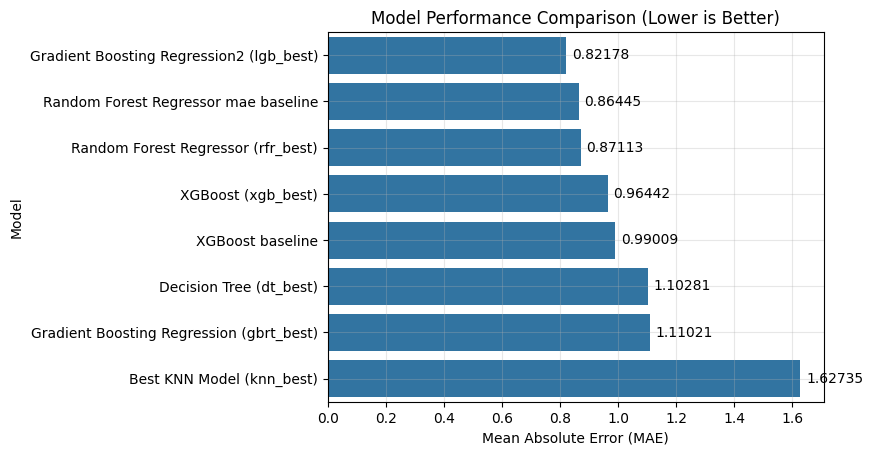

In [51]:
# Convert the dictionary to a DataFrame
dff = pd.DataFrame(list(feature_bank.items()), columns=['Model', 'MAE'])

# Sort the DataFrame by MAE
df_sorted = dff.sort_values('MAE')

# Create the bar plot
ax = sns.barplot(x='MAE', y='Model', data=df_sorted)

plt.title('Model Performance Comparison (Lower is Better)')
plt.xlabel('Mean Absolute Error (MAE)')
plt.ylabel('Model')

# Loop over the bars and use plt.text() to display the MAE value on each bar
for p in ax.patches:
    width = p.get_width()
    plt.text(width + 0.02,  # x-coordinate position of text
             p.get_y() + p.get_height() / 2,  # y-coordinate position of text
             '{:1.5f}'.format(width),  # Text to be displayed
             va='center')  # Center alignment of text

plt.grid(alpha=0.3)
plt.show()

<hr>

<hr>

<h4>06 Model Training</h4>

In [52]:
x = []
src2 = r"C:\Users\Acer\Desktop\Hackathon4\farm-connect-soil-water-content-prediction\test\test"
for file in os.listdir(src2):
    print(os.path.join(src2,file))
    x.append(pd.read_csv(os.path.join(src2,file)))
x = pd.concat(x)
x = x.fillna(0)
x

C:\Users\Acer\Desktop\Hackathon4\farm-connect-soil-water-content-prediction\test\test\set02.csv
C:\Users\Acer\Desktop\Hackathon4\farm-connect-soil-water-content-prediction\test\test\set09.csv


,index,time,1Air Humidity,1AirTemperature,1LightHigh,1LightLow,11Rain Accumulate (mm),11Rain count,12WindSpeed,13WindDirection,23SoilTemp.อุณหภูมิดิน,23SoilEC,23SoilpH,26N,26P,26K,29SoilTension,flow1
0,02_1,04:11:15.736838+00,46.2,30.7,65.53,8.79,0.0,0.0,1.3,2.0,22.4,0.11,7.9,21.0,95.0,88.0,26.0,0.0
1,02_2,04:13:15.740386+00,46.0,31.4,65.53,8.26,0.0,0.0,0.0,1.0,22.4,0.11,7.9,21.0,95.0,88.0,26.0,0.0
2,02_3,04:15:17.720768+00,44.4,32.2,65.53,8.66,0.0,0.0,1.0,2.0,22.3,0.11,7.9,21.0,95.0,88.0,0.0,0.0
3,02_4,04:17:15.750584+00,43.0,33.0,65.53,8.68,0.0,0.0,0.0,2.0,22.4,0.11,7.9,21.0,95.0,88.0,26.0,0.0
4,02_5,04:19:15.75123+00,42.4,32.9,65.53,8.86,0.0,0.0,0.0,2.0,22.4,0.11,7.9,21.0,95.0,88.0,26.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
111,09_112,07:20:44.482378+00,36.2,35.9,0.00,53.35,0.0,0.0,0.0,3.0,23.7,0.12,4.9,27.0,110.0,103.0,48.0,0.0
112,09_113,07:22:46.459288+00,39.8,35.9,0.00,54.13,0.0,0.0,1.9,0.0,23.7,0.12,4.9,27.0,110.0,103.0,0.0,0.0
113,09_114,07:24:44.482942+00,38.4,35.8,0.00,54.11,0.0,0.0,0.0,1.0,23.7,0.12,4.9,27.0,110.0,103.0,48.0,0.0
114,09_115,07:26:44.533862+00,38.2,35.6,0.00,54.26,0.0,0.0,0.0,1.0,23.7,0.12,4.9,27.0,110.0,103.0,45.0,0.0


In [53]:
# Define the function to categorize time of day
def get_time_of_day(hour):
    if 0 <= hour < 5:           # 'Early Morning'
        return 0.0
    elif 5 <= hour < 12:        # 'Morning'
        return 1.0
    elif 12 <= hour < 17:       # 'Afternoon'
        return 2.0
    elif 17 <= hour < 21:       # 'Evening'
        return 3.0
    else:                       # 'Night'
        return 4.0

# Convert 'time' column to datetime objects, ignoring the timezone for simplicity
x['time_parsed'] = pd.to_datetime(x['time'].str.split('+').str[0], format='%H:%M:%S.%f')

# Extract hour from the 'time_parsed' column
x['hour'] = x['time_parsed'].dt.hour

# Apply the get_time_of_day function to create 'time_of_day' column
x['time_of_day'] = x['hour'].apply(get_time_of_day)

x['time_of_day'] = x['time_of_day'].astype('float64')
x['hour'] = x['hour'].astype('float64')
# Now x includes the new 'time_of_day' column
print(x[['time', 'time_of_day']])


                   time  time_of_day
0    04:11:15.736838+00          0.0
1    04:13:15.740386+00          0.0
2    04:15:17.720768+00          0.0
3    04:17:15.750584+00          0.0
4     04:19:15.75123+00          0.0
..                  ...          ...
111  07:20:44.482378+00          1.0
112  07:22:46.459288+00          1.0
113  07:24:44.482942+00          1.0
114  07:26:44.533862+00          1.0
115  07:28:44.505057+00          1.0

[229 rows x 2 columns]


In [54]:
x = x.drop(['index','time','11Rain Accumulate (mm)','11Rain count','time_parsed',],axis=1)

In [55]:
X.columns

Index(['23SoilEC', '26P', '26K', '26N', '1AirTemperature',
       '23SoilTemp.อุณหภูมิดิน', '23SoilpH', '1LightLow', 'hour'],
      dtype='object')

In [56]:
x = x[X.columns]
x

,23SoilEC,26P,26K,26N,1AirTemperature,23SoilTemp.อุณหภูมิดิน,23SoilpH,1LightLow,hour
0,0.11,95.0,88.0,21.0,30.7,22.4,7.9,8.79,4.0
1,0.11,95.0,88.0,21.0,31.4,22.4,7.9,8.26,4.0
2,0.11,95.0,88.0,21.0,32.2,22.3,7.9,8.66,4.0
3,0.11,95.0,88.0,21.0,33.0,22.4,7.9,8.68,4.0
4,0.11,95.0,88.0,21.0,32.9,22.4,7.9,8.86,4.0
...,...,...,...,...,...,...,...,...,...
111,0.12,110.0,103.0,27.0,35.9,23.7,4.9,53.35,7.0
112,0.12,110.0,103.0,27.0,35.9,23.7,4.9,54.13,7.0
113,0.12,110.0,103.0,27.0,35.8,23.7,4.9,54.11,7.0
114,0.12,110.0,103.0,27.0,35.6,23.7,4.9,54.26,7.0


In [57]:
# scaler = RobustScaler()
# x_test = scaler.fit_transform(x_test)
# x_test = scaler.transform(x_test)
# x_test = pd.DataFrame(x_test, columns=[cols])

In [63]:
y = gbrt_best.predict(x)
y

array([34.27697088, 34.16939856, 34.28623125, 34.31327527, 34.24162702,
       34.26720389, 34.28623125, 34.40208859, 34.13047396, 34.27697088,
       34.41661568, 34.13047396, 34.41661568, 33.9632563 , 34.27697088,
       35.57494828, 36.01168649, 43.10483809, 43.7452966 , 45.24130857,
       44.71862692, 45.94878699, 45.20269066, 45.98867565, 47.31578663,
       46.94060954, 46.94060954, 46.83303721, 46.24577913, 33.82982914,
       45.54721728, 34.45888022, 46.52122607, 46.53974931, 48.27329005,
       51.01659222, 51.93835666, 51.91103266, 49.69881183, 50.29686189,
       35.77477401, 48.83652391, 48.83652391, 49.64222535, 52.0690359 ,
       49.95593994, 50.60576319, 49.40299096, 36.061775  , 49.37566696,
       49.96292505, 49.10383081, 46.48645384, 46.90583731, 47.81683285,
       46.32981703, 46.43738936, 47.08721261, 46.43738936, 48.47558655,
       36.59261254, 48.19775095, 32.27473125, 40.71414494, 40.71414494,
       31.2895049 , 39.28895026, 39.52194773, 38.14772291, 38.35

In [59]:
len(y)

229

<hr>

<h4>07 Create SSV</h4>

In [64]:
submission = pd.read_csv(r"C:\Users\Acer\Desktop\Hackathon4\farm-connect-soil-water-content-prediction\sample_submission.csv")
submission

,index,23SoilWC ค.ชื้นดิน
0,02_1,31.1
1,02_2,NaN
2,02_3,NaN
3,02_4,NaN
4,02_5,NaN
...,...,...
224,09_112,NaN
225,09_113,NaN
226,09_114,NaN
227,09_115,NaN


In [65]:
submission['23SoilWC ค.ชื้นดิน'].iloc[1:] = y[1:]
submission

,index,23SoilWC ค.ชื้นดิน
0,02_1,31.100000
1,02_2,34.169399
2,02_3,34.286231
3,02_4,34.313275
4,02_5,34.241627
...,...,...
224,09_112,38.095410
225,09_113,38.095410
226,09_114,38.095410
227,09_115,38.095410


In [67]:
10/0
submission.to_csv('v.0.7.2(0.82177.1839).csv',index=False)